In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import style
style.use('ggplot')
%matplotlib inline

import plotly
import plotly.express as px
import plotly.graph_objects as go

plt.rcParams['figure.figsize']=17,8
import cufflinks as cf
import plotly.offline as pyo
from plotly.offline import init_notebook_mode,plot,iplot
import folium


In [2]:
pyo.init_notebook_mode(connected=True)
cf.go_offline()

# <center>World Covid-19 Analysis</center>

<p>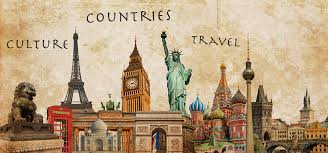</p>

In [3]:
df = pd.read_csv(r"covid_19_data.csv")
df

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...
85633,85634,08/12/2020,Zaporizhia Oblast,Ukraine,2020-08-13 04:29:15,971.0,22.0,680.0
85634,85635,08/12/2020,Zeeland,Netherlands,2020-08-13 04:29:15,950.0,69.0,0.0
85635,85636,08/12/2020,Zhejiang,Mainland China,2020-08-13 04:29:15,1275.0,1.0,1268.0
85636,85637,08/12/2020,Zhytomyr Oblast,Ukraine,2020-08-13 04:29:15,2215.0,48.0,1574.0


In [4]:
df.isnull().sum()

SNo                    0
ObservationDate        0
Province/State     28297
Country/Region         0
Last Update            0
Confirmed              0
Deaths                 0
Recovered              0
dtype: int64

In [5]:
df.drop(['SNo'],axis = 1,inplace = True)

In [6]:

df.drop(['Last Update'],axis = 1 , inplace = True)

In [7]:
df

,ObservationDate,Province/State,Country/Region,Confirmed,Deaths,Recovered
0,01/22/2020,Anhui,Mainland China,1.0,0.0,0.0
1,01/22/2020,Beijing,Mainland China,14.0,0.0,0.0
2,01/22/2020,Chongqing,Mainland China,6.0,0.0,0.0
3,01/22/2020,Fujian,Mainland China,1.0,0.0,0.0
4,01/22/2020,Gansu,Mainland China,0.0,0.0,0.0
...,...,...,...,...,...,...
85633,08/12/2020,Zaporizhia Oblast,Ukraine,971.0,22.0,680.0
85634,08/12/2020,Zeeland,Netherlands,950.0,69.0,0.0
85635,08/12/2020,Zhejiang,Mainland China,1275.0,1.0,1268.0
85636,08/12/2020,Zhytomyr Oblast,Ukraine,2215.0,48.0,1574.0


In [8]:
last_date = df.ObservationDate.max()
df_countries = df[df['ObservationDate']==last_date]

In [9]:
df_countries

,ObservationDate,Province/State,Country/Region,Confirmed,Deaths,Recovered
84896,08/12/2020,NaN,Afghanistan,37345.0,1354.0,26694.0
84897,08/12/2020,NaN,Albania,6817.0,208.0,3552.0
84898,08/12/2020,NaN,Algeria,36699.0,1333.0,25627.0
84899,08/12/2020,NaN,Andorra,977.0,53.0,855.0
84900,08/12/2020,NaN,Angola,1762.0,80.0,577.0
...,...,...,...,...,...,...
85633,08/12/2020,Zaporizhia Oblast,Ukraine,971.0,22.0,680.0
85634,08/12/2020,Zeeland,Netherlands,950.0,69.0,0.0
85635,08/12/2020,Zhejiang,Mainland China,1275.0,1.0,1268.0
85636,08/12/2020,Zhytomyr Oblast,Ukraine,2215.0,48.0,1574.0


In [10]:
first_date = df.ObservationDate.min()
df_countries_low = df[df['ObservationDate']==first_date]
df_countries_low

,ObservationDate,Province/State,Country/Region,Confirmed,Deaths,Recovered
0,01/22/2020,Anhui,Mainland China,1.0,0.0,0.0
1,01/22/2020,Beijing,Mainland China,14.0,0.0,0.0
2,01/22/2020,Chongqing,Mainland China,6.0,0.0,0.0
3,01/22/2020,Fujian,Mainland China,1.0,0.0,0.0
4,01/22/2020,Gansu,Mainland China,0.0,0.0,0.0
5,01/22/2020,Guangdong,Mainland China,26.0,0.0,0.0
6,01/22/2020,Guangxi,Mainland China,2.0,0.0,0.0
7,01/22/2020,Guizhou,Mainland China,1.0,0.0,0.0
8,01/22/2020,Hainan,Mainland China,4.0,0.0,0.0
9,01/22/2020,Hebei,Mainland China,1.0,0.0,0.0


In [11]:
Tconfirmed_begin=df_countries_low.groupby('Country/Region')['Confirmed'].sum().sort_values(ascending=False).to_frame()
Tconfirmed_begin.style.background_gradient(cmap="Greys")

,Confirmed
Country/Region,
Mainland China,547.000000
Thailand,2.000000
Japan,2.000000
US,1.000000
Taiwan,1.000000
South Korea,1.000000
Macau,1.000000
Hong Kong,0.000000


# Growth of COVID19 (Upto 12 Aug)

This Sections show the Growth Rate of COVID19 throughout the world from 22nd january 2020. 
We have been visualizing the data using Styling Gradient and tree maps to show the share of COVID19 Cases worldwide.
At last we able to present Covid-19 CDR trend and the growth of new area with upcoming dates

In [12]:
Tconfirmed=df_countries.groupby('Country/Region')['Confirmed'].sum().sort_values(ascending=False).to_frame()

In [13]:
Tconfirmed.style.background_gradient(cmap="Reds")

,Confirmed
Country/Region,
US,5197118.000000
Brazil,3164785.000000
India,2396637.000000
Russia,900745.000000
South Africa,568919.000000
Mexico,498380.000000
Peru,489680.000000
Colombia,422519.000000
Chile,378168.000000


In [14]:
Tdeaths=df_countries.groupby('Country/Region')['Deaths'].sum().sort_values(ascending=False).to_frame()
Tdeaths.style.background_gradient(cmap="Greens")

,Deaths
Country/Region,
US,166026.000000
Brazil,104201.000000
Mexico,54666.000000
India,47033.000000
UK,46791.000000
Italy,35225.000000
France,30375.000000
Spain,28579.000000
Peru,21501.000000


In [15]:
Trecovered=df_countries.groupby('Country/Region')['Recovered'].sum().sort_values(ascending=False).to_frame()
Trecovered.style.background_gradient(cmap="Blues")

,Recovered
Country/Region,
Brazil,2506228.000000
US,1753760.000000
India,1695982.000000
Russia,708900.000000
South Africa,432029.000000
Mexico,401182.000000
Chile,351419.000000
Peru,341938.000000
Iran,290244.000000


In [16]:
df.groupby('ObservationDate').sum()

,Confirmed,Deaths,Recovered
ObservationDate,,,
01/22/2020,555.0,17.0,28.0
01/23/2020,653.0,18.0,30.0
01/24/2020,941.0,26.0,36.0
01/25/2020,1438.0,42.0,39.0
01/26/2020,2118.0,56.0,52.0
...,...,...,...
08/08/2020,19637506.0,726781.0,11939109.0
08/09/2020,19861683.0,731326.0,12115825.0
08/10/2020,20089624.0,736191.0,12280520.0


In [17]:
df.rename(columns={'ObservationDate':'Date'},inplace=True)

In [18]:
df

,Date,Province/State,Country/Region,Confirmed,Deaths,Recovered
0,01/22/2020,Anhui,Mainland China,1.0,0.0,0.0
1,01/22/2020,Beijing,Mainland China,14.0,0.0,0.0
2,01/22/2020,Chongqing,Mainland China,6.0,0.0,0.0
3,01/22/2020,Fujian,Mainland China,1.0,0.0,0.0
4,01/22/2020,Gansu,Mainland China,0.0,0.0,0.0
...,...,...,...,...,...,...
85633,08/12/2020,Zaporizhia Oblast,Ukraine,971.0,22.0,680.0
85634,08/12/2020,Zeeland,Netherlands,950.0,69.0,0.0
85635,08/12/2020,Zhejiang,Mainland China,1275.0,1.0,1268.0
85636,08/12/2020,Zhytomyr Oblast,Ukraine,2215.0,48.0,1574.0


In [19]:
fig = px.treemap(Tconfirmed.reset_index(),path=['Country/Region'],values='Confirmed',color='Confirmed',title="Total Confirmed Cases")                
fig.show()

In [20]:

td = Tdeaths.reset_index().replace(0, np.nan)
fig = px.treemap(td,path=['Country/Region'],values='Deaths',color='Deaths',title="Total Deaths")          
fig.show()

In [21]:
tr = Trecovered.reset_index().replace(0, np.nan)
fig = px.treemap(tr,path=['Country/Region'],values='Recovered',color='Recovered',title="Total Recovered Cases")                
fig.show()

In [22]:
confirmed=df.groupby('Date').sum()['Confirmed'].reset_index()
confirmed

,Date,Confirmed
0,01/22/2020,555.0
1,01/23/2020,653.0
2,01/24/2020,941.0
3,01/25/2020,1438.0
4,01/26/2020,2118.0
...,...,...
199,08/08/2020,19637506.0
200,08/09/2020,19861683.0
201,08/10/2020,20089624.0
202,08/11/2020,20343589.0


In [23]:
death=df.groupby('Date').sum()['Deaths'].reset_index()
death

,Date,Deaths
0,01/22/2020,17.0
1,01/23/2020,18.0
2,01/24/2020,26.0
3,01/25/2020,42.0
4,01/26/2020,56.0
...,...,...
199,08/08/2020,726781.0
200,08/09/2020,731326.0
201,08/10/2020,736191.0
202,08/11/2020,742615.0


In [24]:
recover=df.groupby('Date').sum()['Recovered'].reset_index()
recover

,Date,Recovered
0,01/22/2020,28.0
1,01/23/2020,30.0
2,01/24/2020,36.0
3,01/25/2020,39.0
4,01/26/2020,52.0
...,...,...
199,08/08/2020,11939109.0
200,08/09/2020,12115825.0
201,08/10/2020,12280520.0
202,08/11/2020,12585473.0


In [25]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=confirmed['Date'],y=confirmed['Confirmed'],mode='lines',name='Confirmed',line=dict(color='blue',width=2)))
fig.add_trace(go.Scatter(x=death['Date'],y=death['Deaths'],mode='lines',name='Deaths',line=dict(color='red',width=2)))
fig.add_trace(go.Scatter(x=recover['Date'],y=recover['Recovered'],mode='lines',name='Recovered',line=dict(color='green',width=2)))
fig.update_layout(title='World-Wide Corona CDR Update')

In [26]:
df1 = pd.read_csv(r"time_series_covid_19_confirmed.csv")

In [27]:
df2 = df1.drop(['Province/State'],axis = 1)
df2

,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,...,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20
0,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,0,...,36747,36782,36829,36896,37015,37054,37054,37162,37269,37345
1,Albania,41.153300,20.168300,0,0,0,0,0,0,0,...,5620,5750,5889,6016,6151,6275,6411,6536,6676,6817
2,Algeria,28.033900,1.659600,0,0,0,0,0,0,0,...,31972,32504,33055,33626,34155,34693,35160,35712,36204,36699
3,Andorra,42.506300,1.521800,0,0,0,0,0,0,0,...,937,939,939,944,955,955,955,963,963,977
4,Angola,-11.202700,17.873900,0,0,0,0,0,0,0,...,1280,1344,1395,1483,1538,1572,1672,1679,1735,1762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,0,...,12541,12770,13065,13398,13722,13928,14208,14510,14875,15184
262,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,0,...,10,10,10,10,10,10,10,10,10,10
263,Yemen,15.552727,48.516388,0,0,0,0,0,0,0,...,1734,1760,1763,1768,1796,1797,1804,1832,1831,1841
264,Zambia,-13.133897,27.849332,0,0,0,0,0,0,0,...,6580,6793,7022,7164,7486,7903,8085,8210,8275,8501


In [28]:
df_latlong=pd.merge(df,df2,on=['Country/Region'])
df_latlong

,Date,Province/State,Country/Region,Confirmed,Deaths,Recovered,Lat,Long,1/22/20,1/23/20,...,8/3/20,8/4/20,8/5/20,8/6/20,8/7/20,8/8/20,8/9/20,8/10/20,8/11/20,8/12/20
0,01/22/2020,Washington,US,1.0,0.0,0.0,40.00,-100.0000,1,1,...,4713540,4771080,4823890,4883582,4941755,4997929,5044864,5094400,5141208,5197118
1,01/23/2020,Washington,US,1.0,0.0,0.0,40.00,-100.0000,1,1,...,4713540,4771080,4823890,4883582,4941755,4997929,5044864,5094400,5141208,5197118
2,01/24/2020,Washington,US,1.0,0.0,0.0,40.00,-100.0000,1,1,...,4713540,4771080,4823890,4883582,4941755,4997929,5044864,5094400,5141208,5197118
3,01/24/2020,Chicago,US,1.0,0.0,0.0,40.00,-100.0000,1,1,...,4713540,4771080,4823890,4883582,4941755,4997929,5044864,5094400,5141208,5197118
4,01/25/2020,Washington,US,1.0,0.0,0.0,40.00,-100.0000,1,1,...,4713540,4771080,4823890,4883582,4941755,4997929,5044864,5094400,5141208,5197118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138093,08/08/2020,NaN,Lesotho,742.0,23.0,175.0,-29.61,28.2336,0,0,...,718,726,726,742,742,742,742,781,781,798
138094,08/09/2020,NaN,Lesotho,742.0,23.0,175.0,-29.61,28.2336,0,0,...,718,726,726,742,742,742,742,781,781,798
138095,08/10/2020,NaN,Lesotho,781.0,24.0,175.0,-29.61,28.2336,0,0,...,718,726,726,742,742,742,742,781,781,798
138096,08/11/2020,NaN,Lesotho,781.0,24.0,175.0,-29.61,28.2336,0,0,...,718,726,726,742,742,742,742,781,781,798


In [29]:
fig=px.density_mapbox(df_latlong,lat="Lat",lon="Long",hover_name="Country/Region",animation_frame='Date',color_continuous_scale='Portland',radius=7,zoom=0,height=700)
fig.update_layout(title='WorldWide Corona Cases')
fig.update_layout(mapbox_style="open-street-map",mapbox_center_lon=0)
fig.update_layout(margin={'r':0,'t':0,'l':0,'b':0})

## <center>Top 10 Worst Affected Countries By Corona<center>

In [30]:
df_countries = df_countries.groupby('Country/Region', as_index=False)['Confirmed','Deaths',"Recovered"].sum()
df_countries = df_countries.nlargest(10,'Confirmed')
df_countries.style.background_gradient(cmap="Purples")

C:\Users\bhavi\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,Country/Region,Confirmed,Deaths,Recovered
177,US,5197118.000000,166026.000000,1753760.000000
23,Brazil,3164785.000000,104201.000000,2506228.000000
78,India,2396637.000000,47033.000000,1695982.000000
141,Russia,900745.000000,15231.000000,708900.000000
157,South Africa,568919.000000,11010.000000,432029.000000
114,Mexico,498380.000000,54666.000000,401182.000000
135,Peru,489680.000000,21501.000000,341938.000000
36,Colombia,422519.000000,13837.000000,239785.000000
35,Chile,378168.000000,10205.000000,351419.000000
80,Iran,333699.000000,18988.000000,290244.000000


In [31]:
#Pie-Chart Representation

In [32]:
fig=px.pie(df_countries, values='Confirmed', names='Country/Region', title='Top 10 Countries:- Confirmed Cases')
fig.show()

In [33]:
fig=px.pie(df_countries, values='Deaths', names='Country/Region', title='Top 10 Countries:- Death Cases')
fig.show()

In [34]:
fig=px.pie(df_countries, values='Recovered', names='Country/Region', title='Top 10 Countries:- Recovered Cases')
fig.show()

In [35]:
#LinePlot

In [36]:
#getting ploting trend for 10 top countries
df_trend = df.groupby(['Date','Country/Region'], as_index=False)['Confirmed','Deaths','Recovered'].sum()
df_trend = df_trend.merge(df_countries, on='Country/Region')
df_trend.drop(['Confirmed_y','Deaths_y','Recovered_y'],axis=1, inplace=True)
df_trend

C:\Users\bhavi\anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,Date,Country/Region,Confirmed_x,Deaths_x,Recovered_x
0,01/22/2020,US,1.0,0.0,0.0
1,01/23/2020,US,1.0,0.0,0.0
2,01/24/2020,US,2.0,0.0,0.0
3,01/25/2020,US,2.0,0.0,0.0
4,01/26/2020,US,5.0,0.0,0.0
...,...,...,...,...,...
1749,08/08/2020,Peru,463875.0,20649.0,319171.0
1750,08/09/2020,Peru,478024.0,21072.0,324020.0
1751,08/10/2020,Peru,483133.0,21276.0,324020.0
1752,08/11/2020,Peru,489680.0,21501.0,329404.0


In [37]:
df_trend.rename(columns={ 'Confirmed_x':'Confirmed', 'Deaths_x':'Deaths','Recovered_x':'Recovered'}, inplace=True)

In [38]:
df_trend

,Date,Country/Region,Confirmed,Deaths,Recovered
0,01/22/2020,US,1.0,0.0,0.0
1,01/23/2020,US,1.0,0.0,0.0
2,01/24/2020,US,2.0,0.0,0.0
3,01/25/2020,US,2.0,0.0,0.0
4,01/26/2020,US,5.0,0.0,0.0
...,...,...,...,...,...
1749,08/08/2020,Peru,463875.0,20649.0,319171.0
1750,08/09/2020,Peru,478024.0,21072.0,324020.0
1751,08/10/2020,Peru,483133.0,21276.0,324020.0
1752,08/11/2020,Peru,489680.0,21501.0,329404.0


In [39]:
fig = px.line(df_trend, x='Date', y='Confirmed', color='Country/Region', title='COVID19 Confirmed Cases growth for top 10 worst affected countries')
fig.update_layout(hovermode='closest',template='seaborn',width=700,xaxis=dict(mirror=True,linewidth=2,linecolor='black',showgrid=False),
                 yaxis=dict(mirror=True,linewidth=2,linecolor='black'))
fig.show()

In [40]:
fig = px.line(df_trend, x='Date', y='Deaths', color='Country/Region', title='COVID19 Death Rate growth for top 10 worst affected countries')
fig.update_layout(hovermode='closest',template='seaborn',width=700,xaxis=dict(mirror=True,linewidth=2,linecolor='black',showgrid=False),
                 yaxis=dict(mirror=True,linewidth=2,linecolor='black'))
fig.show()

In [41]:
fig = px.line(df_trend, x='Date', y='Recovered',color='Country/Region', title='COVID19 Recovery growth for top 10 worst affected countries')
fig.update_layout(hovermode='closest',template='seaborn',width=700,xaxis=dict(mirror=True,linewidth=2,linecolor='black',showgrid=False),
                 yaxis=dict(mirror=True,linewidth=2,linecolor='black'))
fig.show()

### From the Above Data , We can Conclude that :-

1)China was the first country to experience the onset of virus and it failed to contain it .


2)US,Brazil,India and Italy, which are the worst affected countries currently didn't recond many cases in january. This shows 

that how fast the virus spreads.


3)Brazil may have the second highest amount of confirmed cases, but the recovery rate of Brazil is far more better than any 

country.


4)US is the worst affected country by Covid-19, and has recorded highest amount of deaths.


5)Lockdown in China has Able to eradicate the Covid-19 Cases,Although India was able to control the cases through lockdown till 

june , but after that there is spike in cases and now it is the 3rd worst affected Country



# <center>Analysis Of India Over Corona Pandemic Situation</center>

<p><center>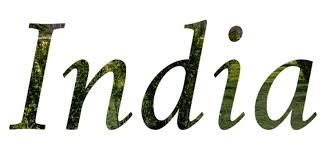</center></p>

## Growth of COVID19 in India(Upto 11 June)

This Sections show the Growth Rate of COVID19 throughout the world from 30th january 2020. We have been visualizing the data 

using Styling Gradient,Bar Graphs,Pie charts and folium maps to show the share of COVID19 Cases of India in world . At last we 

able to present Top 12 Worst affected States with their proper Analysis.

In [42]:
df1 = pd.read_csv(r"covid_19_india.csv")
df1

,Sno,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,1,30-01-2020,6:00 PM,Kerala,1,0,0,0,1
1,2,31-01-2020,6:00 PM,Kerala,1,0,0,0,1
2,3,01-02-2020,6:00 PM,Kerala,2,0,0,0,2
3,4,02-02-2020,6:00 PM,Kerala,3,0,0,0,3
4,5,03-02-2020,6:00 PM,Kerala,3,0,0,0,3
...,...,...,...,...,...,...,...,...,...
2914,2915,11-06-2020,8:00 AM,Tripura,-,-,239,1,895
2915,2916,11-06-2020,8:00 AM,Uttarakhand,-,-,831,15,1562
2916,2917,11-06-2020,8:00 AM,Uttar Pradesh,-,-,6871,321,11610
2917,2918,11-06-2020,8:00 AM,West Bengal,-,-,3779,432,9328


In [43]:
df1.isnull().sum()

Sno                          0
Date                         0
Time                         0
State/UnionTerritory        23
ConfirmedIndianNational      0
ConfirmedForeignNational     0
Cured                        0
Deaths                       0
Confirmed                    0
dtype: int64

In [44]:
df1.drop(['Sno'],axis=1,inplace=True)

In [45]:
df1.drop(['Time'],axis=1,inplace=True)

In [46]:
df1

,Date,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,30-01-2020,Kerala,1,0,0,0,1
1,31-01-2020,Kerala,1,0,0,0,1
2,01-02-2020,Kerala,2,0,0,0,2
3,02-02-2020,Kerala,3,0,0,0,3
4,03-02-2020,Kerala,3,0,0,0,3
...,...,...,...,...,...,...,...
2914,11-06-2020,Tripura,-,-,239,1,895
2915,11-06-2020,Uttarakhand,-,-,831,15,1562
2916,11-06-2020,Uttar Pradesh,-,-,6871,321,11610
2917,11-06-2020,West Bengal,-,-,3779,432,9328


In [47]:
df1.dropna(inplace=True)

In [48]:
last_date = df1.Date.max()
df1_Obser = df1[df1['Date']==last_date]
df1_Obser

,Date,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
2486,31-05-2020,Andaman and Nicobar Islands,-,-,33,0,33
2487,31-05-2020,Andhra Pradesh,-,-,2289,60,3569
2488,31-05-2020,Arunachal Pradesh,-,-,1,0,4
2489,31-05-2020,Assam,-,-,163,4,1185
2490,31-05-2020,Bihar,-,-,1618,20,3636
2491,31-05-2020,Chandigarh,-,-,189,4,289
2492,31-05-2020,Chhattisgarh,-,-,102,1,447
2493,31-05-2020,Dadar Nagar Haveli,-,-,0,0,2
2494,31-05-2020,Delhi,-,-,8075,416,18549
2495,31-05-2020,Goa,-,-,41,0,70


In [49]:
df1_Obser['Active Cases'] = df1['Confirmed']-(df1['Deaths']+df1['Cured'])
df1_Obser

,Date,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,Active Cases
2486,31-05-2020,Andaman and Nicobar Islands,-,-,33,0,33,0
2487,31-05-2020,Andhra Pradesh,-,-,2289,60,3569,1220
2488,31-05-2020,Arunachal Pradesh,-,-,1,0,4,3
2489,31-05-2020,Assam,-,-,163,4,1185,1018
2490,31-05-2020,Bihar,-,-,1618,20,3636,1998
2491,31-05-2020,Chandigarh,-,-,189,4,289,96
2492,31-05-2020,Chhattisgarh,-,-,102,1,447,344
2493,31-05-2020,Dadar Nagar Haveli,-,-,0,0,2,2
2494,31-05-2020,Delhi,-,-,8075,416,18549,10058
2495,31-05-2020,Goa,-,-,41,0,70,29


In [50]:
Total_Cases=df1_Obser.groupby('State/UnionTerritory')['Confirmed','Cured','Deaths','Active Cases'].sum().sort_values('Confirmed',ascending=False).reset_index()


C:\Users\bhavi\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [51]:
Total_Cases.style.background_gradient(cmap="Oranges")


,State/UnionTerritory,Confirmed,Cured,Deaths,Active Cases
0,Maharashtra,65168,28081,2197,34890
1,Tamil Nadu,21184,12000,160,9024
2,Delhi,18549,8075,416,10058
3,Gujarat,16343,9230,1007,6106
4,Rajasthan,8617,5739,193,2685
5,Madhya Pradesh,7891,4444,343,3104
6,Uttar Pradesh,7445,4410,201,2834
7,West Bengal,5130,1970,309,2851
8,Bihar,3636,1618,20,1998
9,Andhra Pradesh,3569,2289,60,1220


In [52]:
px.bar(Total_Cases.reset_index(),x='State/UnionTerritory',y='Confirmed',color='Confirmed')

In [53]:
px.bar(Total_Cases.reset_index(),x='State/UnionTerritory',y='Deaths',color='Deaths')

In [54]:
px.bar(Total_Cases.reset_index(),x='State/UnionTerritory',y='Cured',color='Cured')

In [55]:
px.bar(Total_Cases.reset_index(),x='State/UnionTerritory',y='Active Cases',color='Active Cases')

## <center>Top 12 Worst Affected States

In [56]:
df1_states = Total_Cases.reset_index().groupby('State/UnionTerritory', as_index=False)['Confirmed','Deaths',"Cured","Active Cases"].sum()
df1_states = df1_states.nlargest(12,'Confirmed')
df1_states.style.background_gradient(cmap="Purples")

C:\Users\bhavi\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,State/UnionTerritory,Confirmed,Deaths,Cured,Active Cases
19,Maharashtra,65168,2197,28081,34890
29,Tamil Nadu,21184,160,12000,9024
8,Delhi,18549,416,8075,10058
10,Gujarat,16343,1007,9230,6106
27,Rajasthan,8617,193,5739,2685
18,Madhya Pradesh,7891,343,4444,3104
32,Uttar Pradesh,7445,201,4410,2834
34,West Bengal,5130,309,1970,2851
4,Bihar,3636,20,1618,1998
1,Andhra Pradesh,3569,60,2289,1220


In [57]:
Indian_Cord=pd.read_excel(r"Indian Coordinates.xlsx")
Indian_Cord

,Name of State / UT,Latitude,Longitude
0,Andaman And Nicobar,11.667026,92.735983
1,Andhra Pradesh,14.750429,78.570026
2,Arunachal Pradesh,27.100399,93.616601
3,Assam,26.749981,94.216667
4,Bihar,25.785414,87.479973
5,Chandigarh,30.719997,76.780006
6,Chhattisgarh,22.090420,82.159987
7,Dadra And Nagar Haveli,20.266578,73.016618
8,Delhi,28.669993,77.230004
9,Goa,15.491997,73.818001


In [58]:
Indian_Cord.rename(columns={ 'Name of State / UT':'State/UnionTerritory'}, inplace=True)

In [59]:
df1_full=pd.merge(Total_Cases.reset_index(),Indian_Cord,on="State/UnionTerritory")
df1_full

,index,State/UnionTerritory,Confirmed,Cured,Deaths,Active Cases,Latitude,Longitude
0,0,Maharashtra,65168,28081,2197,34890,19.250232,73.160175
1,1,Tamil Nadu,21184,12000,160,9024,12.920386,79.150042
2,2,Delhi,18549,8075,416,10058,28.669993,77.230004
3,4,Rajasthan,8617,5739,193,2685,26.449999,74.639981
4,6,Uttar Pradesh,7445,4410,201,2834,27.599981,78.050006
5,9,Andhra Pradesh,3569,2289,60,1220,14.750429,78.570026
6,10,Karnataka,2922,997,48,1877,12.570381,76.919997
7,11,Telengana,2499,1412,77,1010,18.112400,79.019300
8,13,Punjab,2233,1967,44,222,31.519974,75.980003
9,14,Haryana,1923,971,20,932,28.450006,77.019991


In [60]:
map = folium.Map(location=[20,70],zoom_start=4,tiles='cartodbdark_matter')
for lat,long,value,name in zip(df1_full['Latitude'],df1_full['Longitude'],df1_full['Confirmed'],df1_full['State/UnionTerritory']):
    folium.CircleMarker([lat,long],radius=value*0.0009,popup=('<strong>State<strong>:'+str(name).capitalize()+'<br>''<strong>Total Cases</strong>:'+str(value)+'<br>'),color='red',fill_color='red',fill_opacity=0.3).add_to(map)

In [61]:
map

In [62]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

labels = df1_states['State/UnionTerritory'].to_frame()
values1 = df1_states['Confirmed']
values2 = df1_states['Deaths']
values3 = df1_states['Cured']
values4 = df1_states['Active Cases']

fig = make_subplots(rows=2, cols=2,specs=[[{'type':'domain'}, {'type':'domain'}],
                                           [{'type':'domain'}, {'type':'domain'}]],subplot_titles=("Confirmed Cases","Deaths","Recovered","Active Cases"))
fig.add_trace(go.Pie(labels=labels, values=values1, pull=[0, 0, 0.2, 0]), 1, 1)
fig.add_trace(go.Pie(labels=labels, values=values2, pull=[0, 0, 0, 0,0.2]), 1, 2)
fig.add_trace(go.Pie(labels=labels, values=values3, pull=[0, 0, 0, 0,0.2]), 2, 1)
fig.add_trace(go.Pie(labels=labels, values=values4, pull=[0, 0, 0, 0,0,0.2]), 2, 2)
fig.show()

In [63]:
fig = px.treemap(df1_states.reset_index(),path=['State/UnionTerritory'],values='Confirmed',color='Confirmed',title="Total Confirmed Cases",color_continuous_scale=px.colors.sequential.Agsunset)                
fig.show()

In [64]:
fig = px.treemap(df1_states.reset_index(),path=['State/UnionTerritory'],values='Deaths',color='Deaths',title="Total Deaths",color_continuous_scale=px.colors.sequential.Agsunset)                
fig.show()

In [65]:
fig = px.treemap(df1_states.reset_index(),path=['State/UnionTerritory'],values='Cured',color='Cured',title="Total Recovered Cases",color_continuous_scale=px.colors.sequential.Agsunset)                
fig.show()

## From the Above Data , We can Conclude that :-

1)Maharashtra failed to contain the spread of virus, and is the worst affected state of India.

2)Although Tamil-Nadu is 2nd worst affected state of India,still it has least amount of Deaths.

3)Gujurat on the other hand,has 2nd highest death rate and also one of the top 5 worst States.

4)Delhi has the Second Highest Active Cases regarding other states.

5)Lockdown has Prevented the increase in the no of cases in different states, but still Maharashtra is the grip of Covid-19 virus firmly.